In [1]:
! pip install tensorflow_addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 6.1 MB/s eta 0:00:00


# Setup and dataset download


In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa

import matplotlib.pyplot as plt
import numpy as np

autotune = tf.data.AUTOTUNE

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [3]:
from google.colab import drive
drive.mount('/content/drive')

import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/kaggle'

Mounted at /content/drive


In [4]:
! kaggle competitions download -c gan-getting-started

100% 366M/367M [00:17<00:00, 23.8MB/s]
100% 367M/367M [00:17<00:00, 21.4MB/s]


In [5]:
import zipfile

# Unzip the archive
local_zip = '/content/gan-getting-started.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall()

zip_ref.close()

# 1.Project Topic
For this competition we will need to use GAN architecture that has two neural networks: one to generate images (generator) and another one to try to classify images (discriminator). In this competition we will need to try to generate Monet-style images. For training data we have 300 Monet images (paintings) and 7038 random images

For the GAN architecture I would like to use CycleGAN as described here - https://keras.io/examples/generative/cyclegan/

DNN has following structure:

1. It starts with 'relu' activation block
2. Then we have 2 downsampling blocks
3. Then 9 residual blocks
4. Then 2 upsampling blocks
5. And finaly conv block with 'tanh' activation

# 2. Data
This dataset contains 2 directories - real photo and monet paintings. All images are in jpg file format and have 256X256 resolution with 3 channels for colors. In total we've been provided with 7038 real photo images and 300 monet paintings

In [6]:
# First let's load the data

base_dir = '/content'
monet_dir = os.path.join(base_dir, 'monet_jpg')
photo_dir = os.path.join(base_dir, 'photo_jpg')

monet_tfrec = os.path.join(base_dir, 'monet_tfrec')
photo_tfrec = os.path.join(base_dir, 'photo_tfrec')

In [9]:
# check filenames
monet_dir_fnames = os.listdir(monet_dir)
photo_dir_fnames = os.listdir(photo_dir)

monet_tfrec_fnames = os.listdir(monet_tfrec)
photo_tfrec_fnames = os.listdir(photo_tfrec)

print(monet_dir_fnames[:10])
print(photo_dir_fnames[:10])

print(monet_tfrec_fnames[:10])
print(photo_tfrec_fnames[:10])

['158740962c.jpg', 'b256e61a5d.jpg', '118da0690c.jpg', '4995c04b1a.jpg', '6c6cc46498.jpg', 'cb9c553ded.jpg', '0a5075d42a.jpg', 'e3112413b1.jpg', 'c6c360756c.jpg', '59df696966.jpg']
['ce6578f48a.jpg', '96cb35f032.jpg', '57e0bbe931.jpg', '07cb260548.jpg', '806806cb9a.jpg', '9b7d65decf.jpg', '8a935bef79.jpg', '0bde6ba99b.jpg', '8a09c3fbff.jpg', 'd3650f6c75.jpg']
['monet16-60.tfrec', 'monet00-60.tfrec', 'monet04-60.tfrec', 'monet08-60.tfrec', 'monet12-60.tfrec']
['photo05-352.tfrec', 'photo01-352.tfrec', 'photo19-350.tfrec', 'photo03-352.tfrec', 'photo00-352.tfrec', 'photo11-352.tfrec', 'photo18-352.tfrec', 'photo04-352.tfrec', 'photo12-352.tfrec', 'photo07-352.tfrec']


In [10]:
print(f"Total monet images: {len(monet_dir_fnames)}")
print(f"Total photo images: {len(photo_dir_fnames)}")

print(f"Total monet tfrec files: {len(monet_tfrec_fnames)}")
print(f"Total photo tfrec files: {len(photo_tfrec_fnames)}")

Total monet images: 300
Total photo images: 7038
Total monet tfrec files: 5
Total photo tfrec files: 20


# 3. Exploratory Data Analysis

For EDA we will need to convert all images to tf ds format and scale all pixels to be in the range from -1 to 1 by deviding by 127.5. Also I've provided couple of examples of how pictures are look like

In [11]:
IMAGE_SIZE = [256, 256]

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

In [14]:
def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=autotune)
    return dataset

In [15]:
MONET_FILENAMES = tf.io.gfile.glob(str('/content' + '/monet_tfrec/*.tfrec'))
print('Monet TFRecord Files:', len(MONET_FILENAMES))

PHOTO_FILENAMES = tf.io.gfile.glob(str('/content' + '/photo_tfrec/*.tfrec'))
print('Photo TFRecord Files:', len(PHOTO_FILENAMES))

monet_ds = load_dataset(MONET_FILENAMES, labeled=True).batch(1)
photo_ds = load_dataset(PHOTO_FILENAMES, labeled=True).batch(1)

Monet TFRecord Files: 5
Photo TFRecord Files: 20


In [16]:
monet_ds = load_dataset(MONET_FILENAMES, labeled=True).batch(1)
photo_ds = load_dataset(PHOTO_FILENAMES, labeled=True).batch(1)

In [17]:
example_monet = next(iter(monet_ds))
example_photo = next(iter(photo_ds))

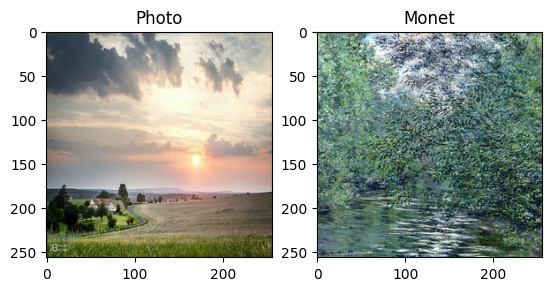

In [18]:
plt.subplot(121)
plt.title('Photo')
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Monet')
plt.imshow(example_monet[0] * 0.5 + 0.5)

In [23]:
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

input_img_size = (256, 256, 3)

#4. Model Architecture.
I've used model architecture described here - https://arxiv.org/pdf/1703.10593.pdf. These are the details:
1. It startw with 'relu' activation block
2. Then we have 2 downsampling blocks
3. Then 9 residual blocks
4. Then 2 upsampling blocks
5. And finaly conv block with 'tanh' activation

# Building blocks used in the CycleGAN generators and discriminators

In [20]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x

# Build the generators

In [21]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model

# Build the discriminators

In [24]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [25]:
# Build the CycleGAN model

In [26]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super().compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # x is Horse and y is zebra
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adversarial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # Horse to fake zebra
            fake_y = self.gen_G(real_x, training=True)
            # Zebra to fake horse -> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (Horse to fake zebra to fake horse): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Zebra to fake horse to fake zebra) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adversarial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }

# Create a callback that periodically saves generated images

In [29]:
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(photo_ds.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.utils.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()

# 5. Results and Analysis

# Train the end-to-end model

Epoch 1/20
    300/Unknown - 90s 127ms/step - G_loss: 4.6358 - F_loss: 4.7845 - D_X_loss: 0.1174 - D_Y_loss: 0.1347

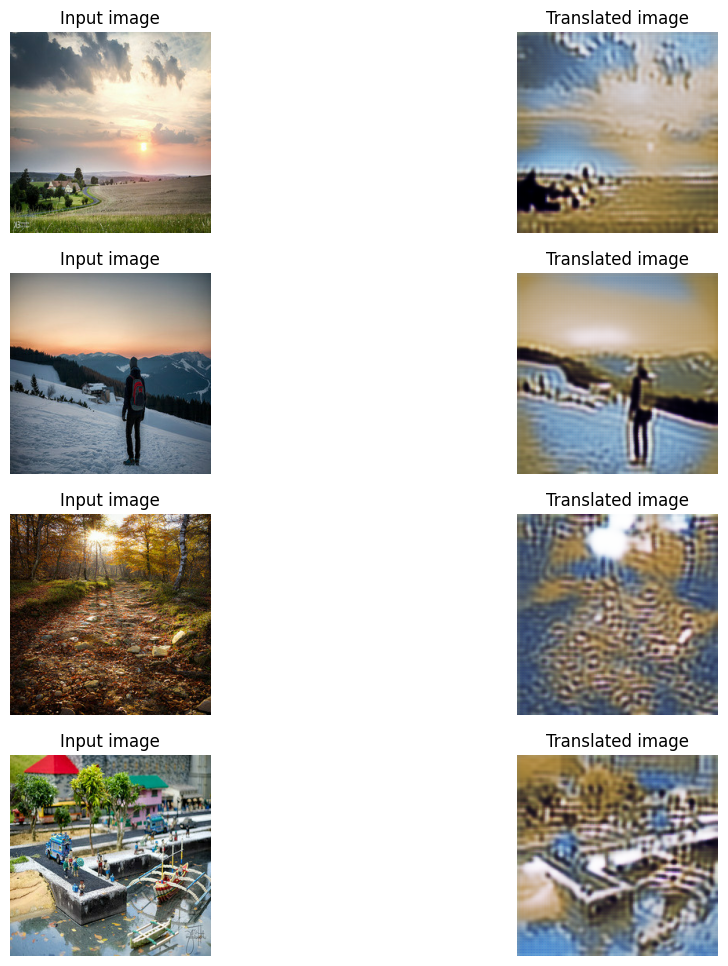

300/300 [==============================] - 94s 141ms/step - G_loss: 4.6304 - F_loss: 4.7917 - D_X_loss: 0.1174 - D_Y_loss: 0.1353
Epoch 2/20
300/300 [==============================] - ETA: 0s - G_loss: 4.4293 - F_loss: 4.5458 - D_X_loss: 0.1167 - D_Y_loss: 0.1464

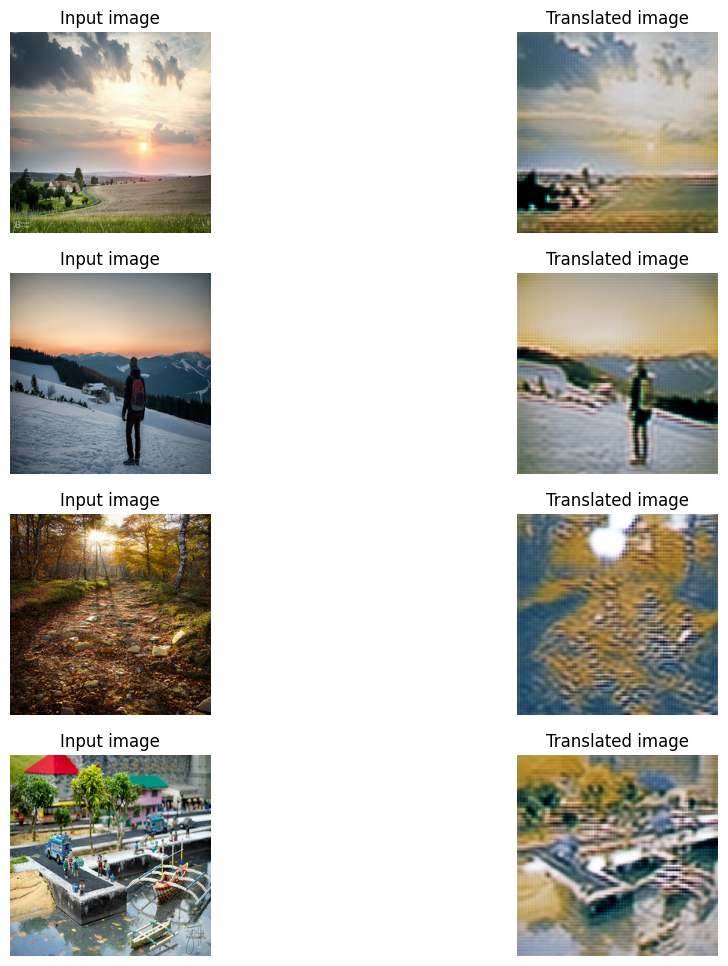

300/300 [==============================] - 41s 135ms/step - G_loss: 4.4243 - F_loss: 4.5533 - D_X_loss: 0.1174 - D_Y_loss: 0.1471
Epoch 3/20
300/300 [==============================] - ETA: 0s - G_loss: 4.1875 - F_loss: 4.4443 - D_X_loss: 0.1055 - D_Y_loss: 0.1593

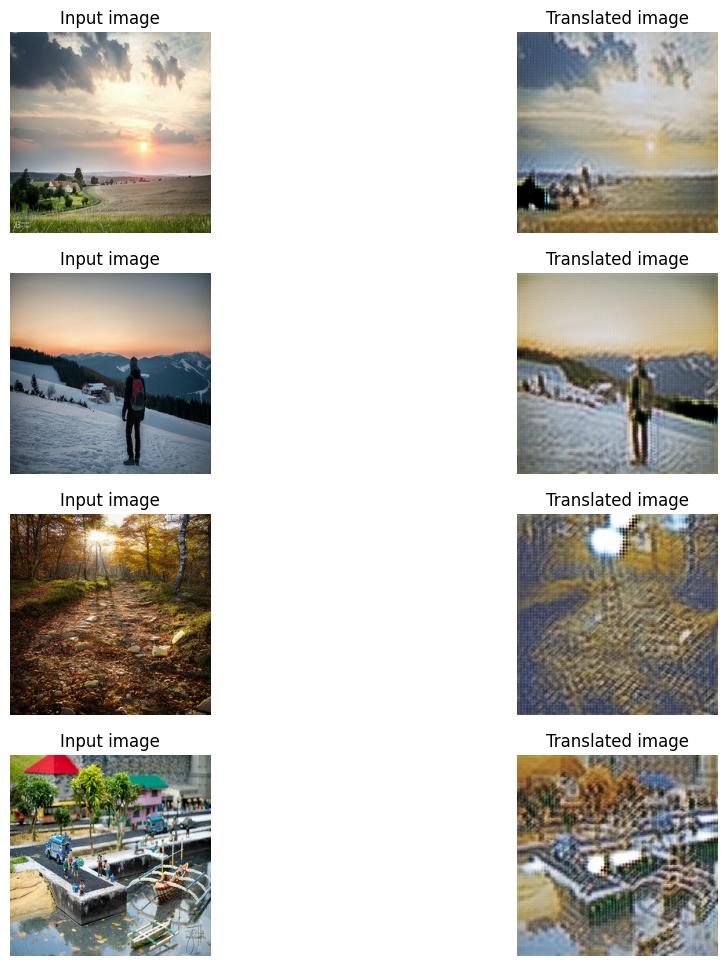

300/300 [==============================] - 41s 136ms/step - G_loss: 4.1846 - F_loss: 4.4511 - D_X_loss: 0.1058 - D_Y_loss: 0.1600
Epoch 4/20
300/300 [==============================] - ETA: 0s - G_loss: 4.0192 - F_loss: 4.1759 - D_X_loss: 0.1609 - D_Y_loss: 0.1812

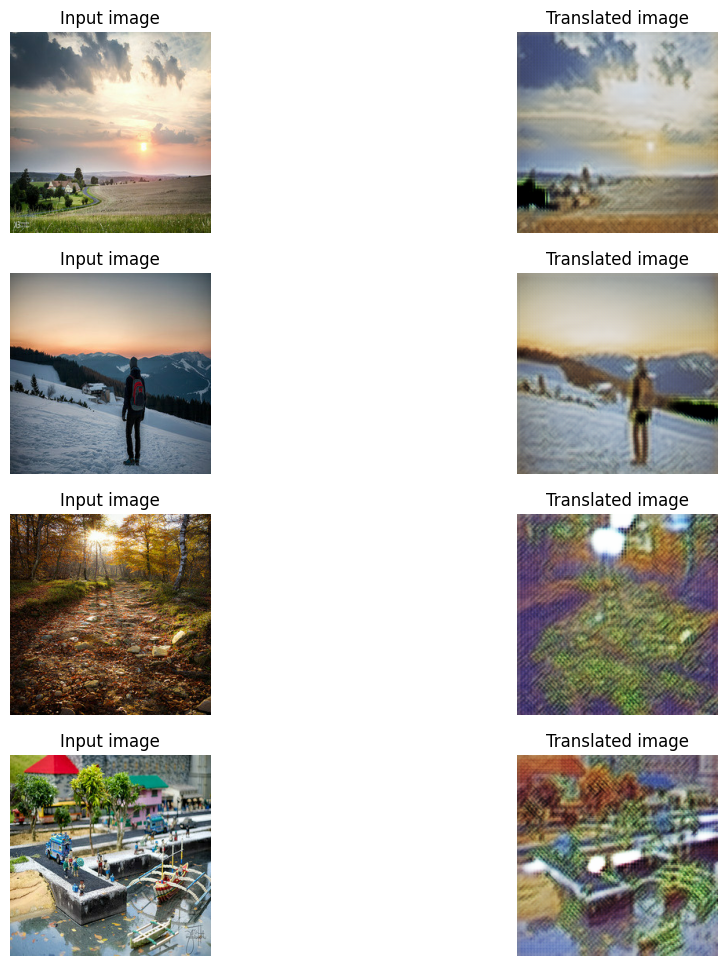

300/300 [==============================] - 42s 139ms/step - G_loss: 4.0150 - F_loss: 4.1845 - D_X_loss: 0.1615 - D_Y_loss: 0.1817
Epoch 5/20
300/300 [==============================] - ETA: 0s - G_loss: 3.9338 - F_loss: 4.0281 - D_X_loss: 0.1698 - D_Y_loss: 0.1663

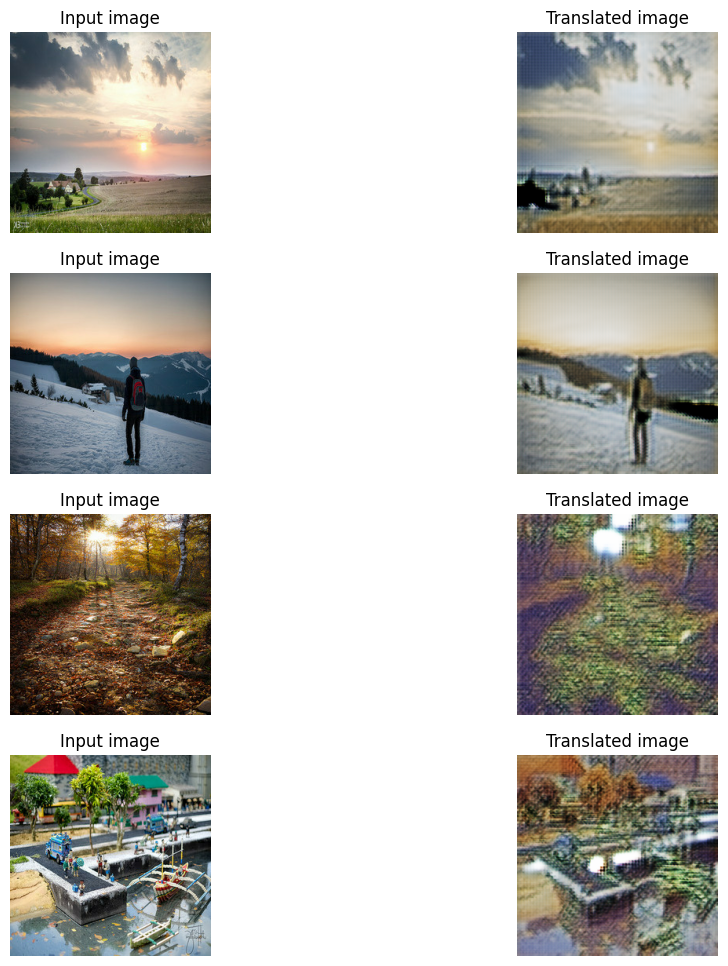

300/300 [==============================] - 41s 136ms/step - G_loss: 3.9309 - F_loss: 4.0357 - D_X_loss: 0.1703 - D_Y_loss: 0.1668
Epoch 6/20
300/300 [==============================] - ETA: 0s - G_loss: 3.8389 - F_loss: 3.9817 - D_X_loss: 0.1547 - D_Y_loss: 0.1842

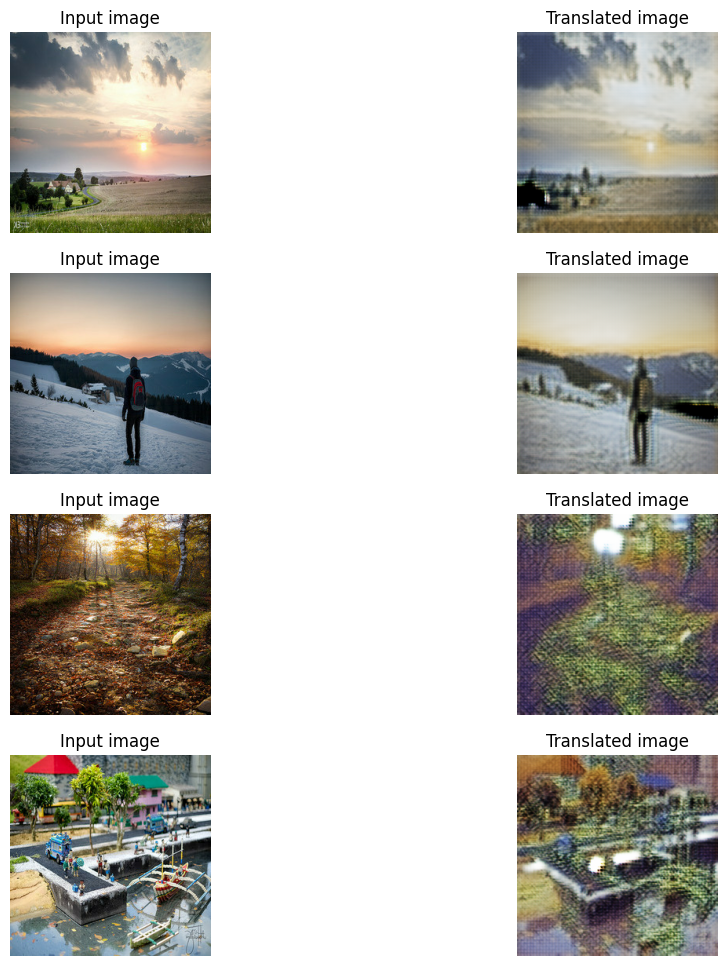

300/300 [==============================] - 41s 136ms/step - G_loss: 3.8368 - F_loss: 3.9885 - D_X_loss: 0.1558 - D_Y_loss: 0.1846
Epoch 7/20
300/300 [==============================] - ETA: 0s - G_loss: 3.7843 - F_loss: 3.8876 - D_X_loss: 0.1578 - D_Y_loss: 0.1900

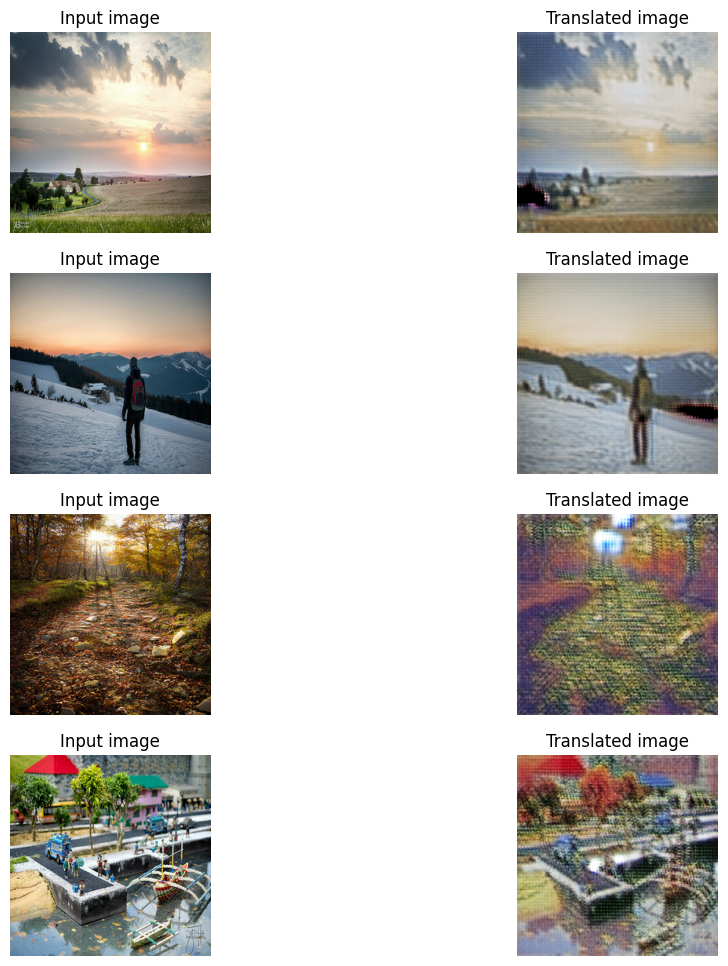

300/300 [==============================] - 41s 136ms/step - G_loss: 3.7813 - F_loss: 3.8936 - D_X_loss: 0.1583 - D_Y_loss: 0.1905
Epoch 8/20
300/300 [==============================] - ETA: 0s - G_loss: 3.7138 - F_loss: 3.7593 - D_X_loss: 0.1825 - D_Y_loss: 0.1812

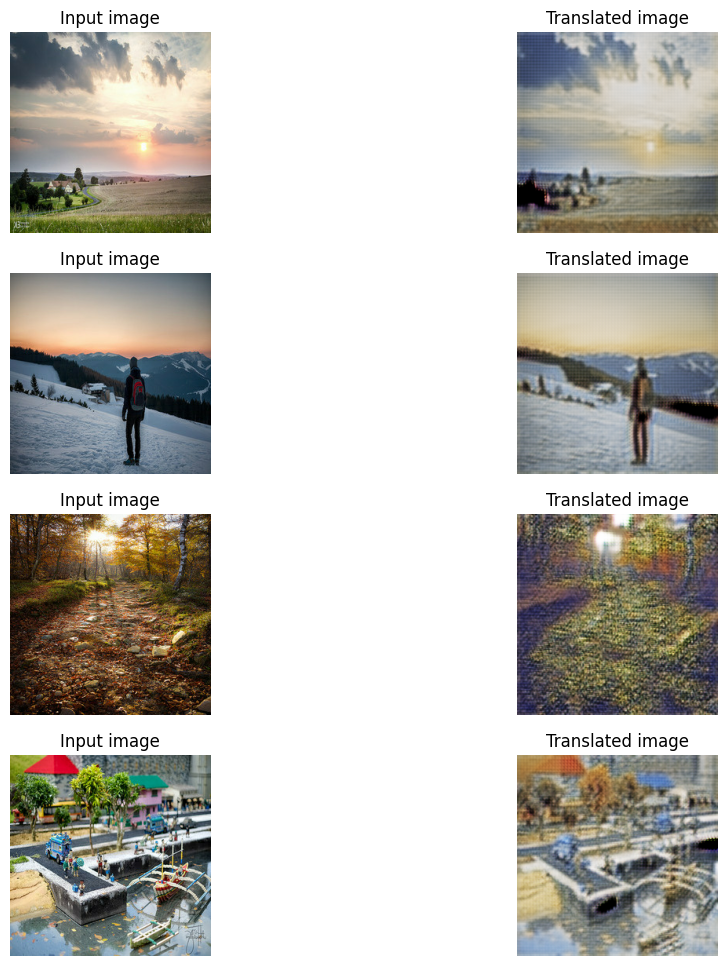

300/300 [==============================] - 41s 136ms/step - G_loss: 3.7121 - F_loss: 3.7659 - D_X_loss: 0.1833 - D_Y_loss: 0.1819
Epoch 9/20
300/300 [==============================] - ETA: 0s - G_loss: 3.6728 - F_loss: 3.6977 - D_X_loss: 0.1853 - D_Y_loss: 0.1876

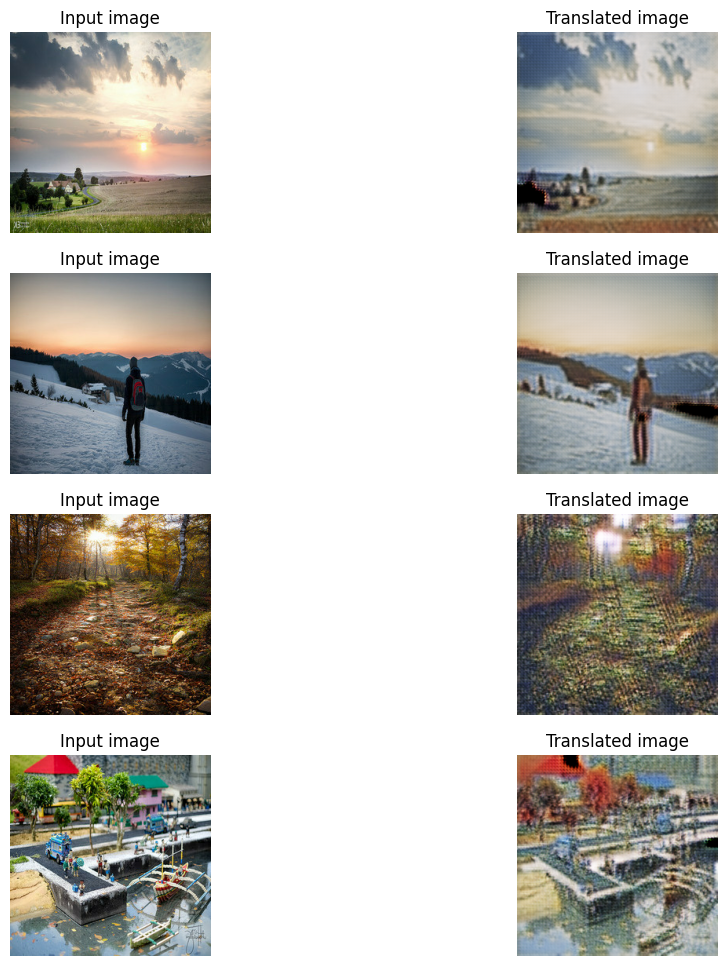

300/300 [==============================] - 41s 136ms/step - G_loss: 3.6722 - F_loss: 3.7019 - D_X_loss: 0.1861 - D_Y_loss: 0.1879
Epoch 10/20
300/300 [==============================] - ETA: 0s - G_loss: 3.6108 - F_loss: 3.6650 - D_X_loss: 0.1899 - D_Y_loss: 0.1953

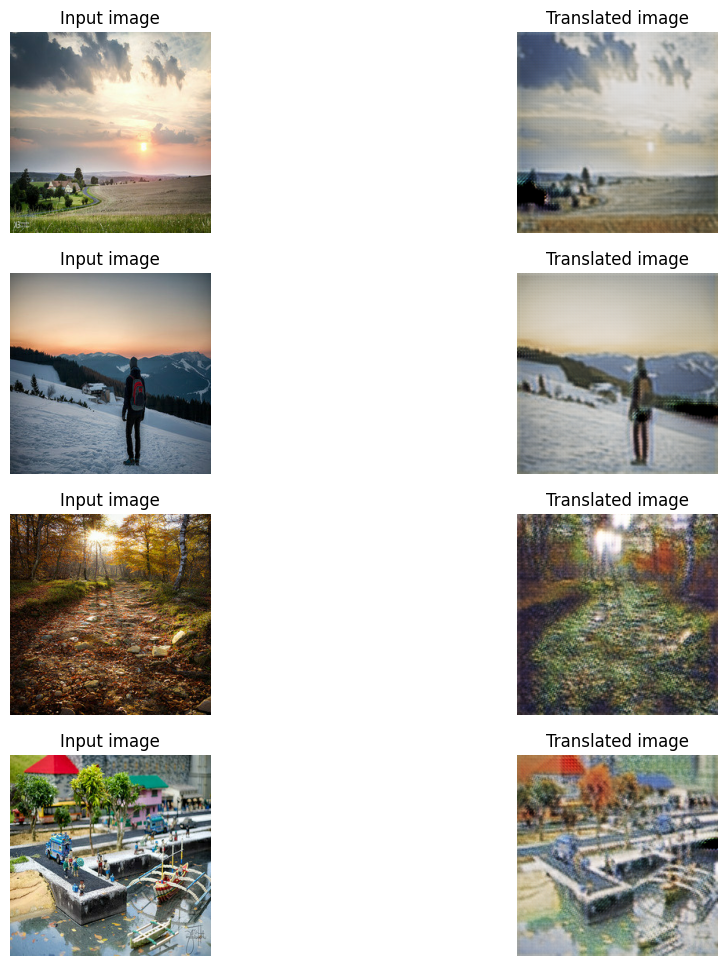

300/300 [==============================] - 41s 136ms/step - G_loss: 3.6079 - F_loss: 3.6689 - D_X_loss: 0.1907 - D_Y_loss: 0.1959
Epoch 11/20
300/300 [==============================] - ETA: 0s - G_loss: 3.5709 - F_loss: 3.5914 - D_X_loss: 0.1942 - D_Y_loss: 0.1863

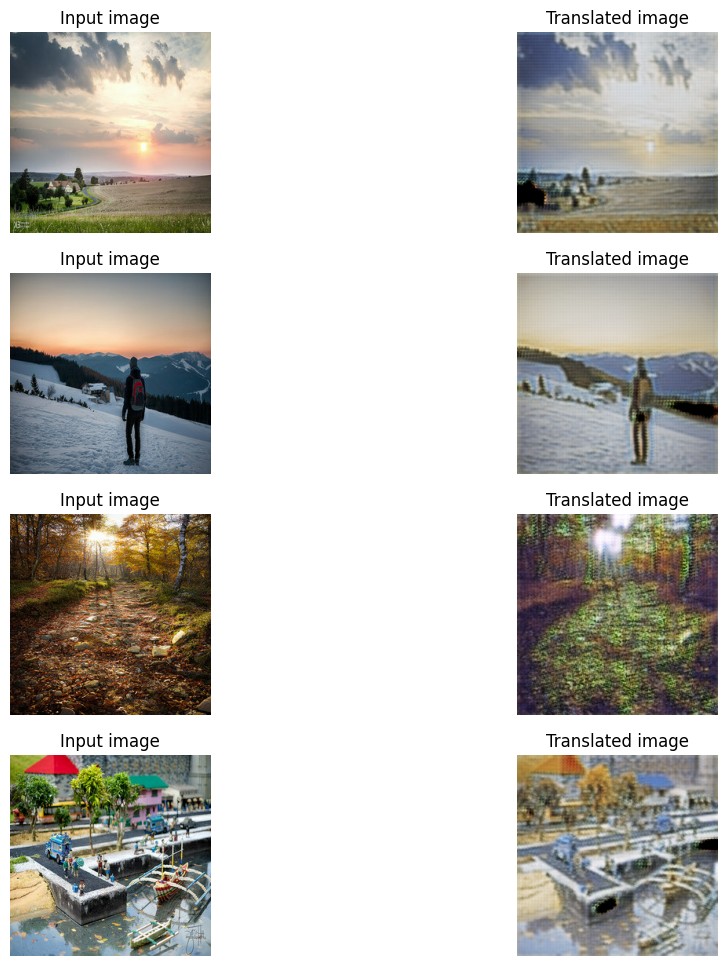

300/300 [==============================] - 41s 136ms/step - G_loss: 3.5682 - F_loss: 3.5956 - D_X_loss: 0.1946 - D_Y_loss: 0.1869
Epoch 12/20
300/300 [==============================] - ETA: 0s - G_loss: 3.5399 - F_loss: 3.4703 - D_X_loss: 0.1940 - D_Y_loss: 0.1880

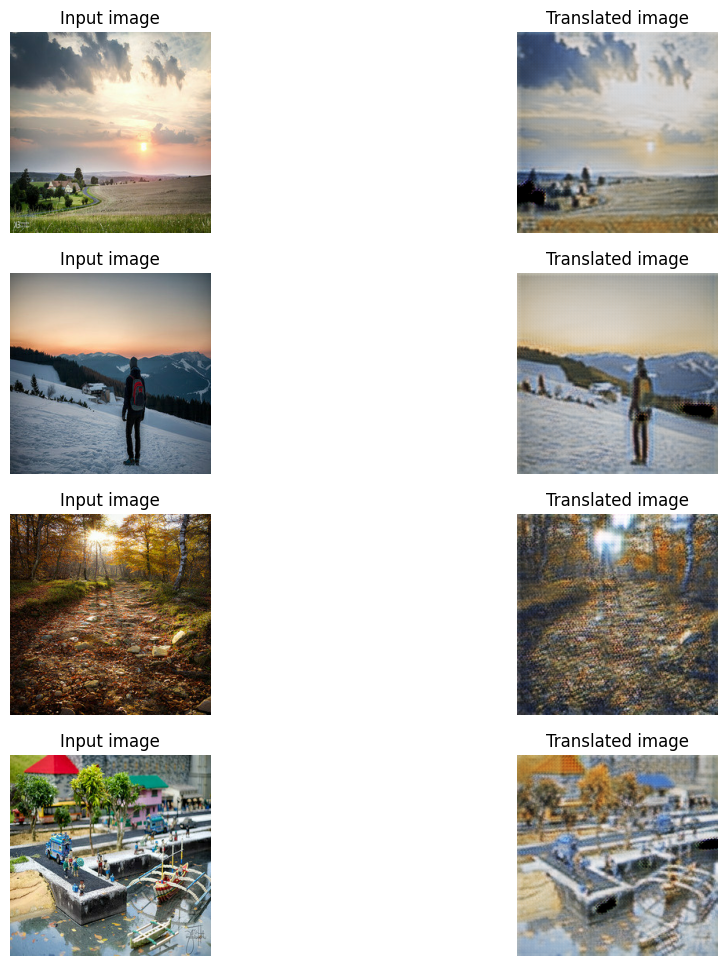

300/300 [==============================] - 41s 136ms/step - G_loss: 3.5370 - F_loss: 3.4745 - D_X_loss: 0.1945 - D_Y_loss: 0.1885
Epoch 13/20
300/300 [==============================] - ETA: 0s - G_loss: 3.5045 - F_loss: 3.4446 - D_X_loss: 0.1879 - D_Y_loss: 0.1799

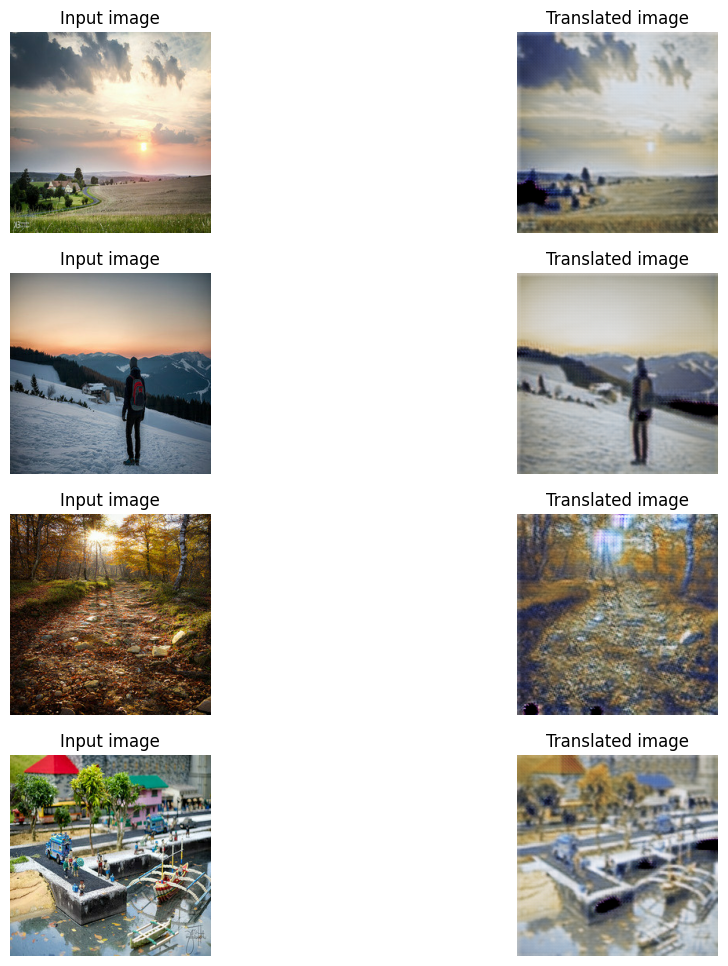

300/300 [==============================] - 41s 136ms/step - G_loss: 3.5029 - F_loss: 3.4525 - D_X_loss: 0.1884 - D_Y_loss: 0.1803
Epoch 14/20
300/300 [==============================] - ETA: 0s - G_loss: 3.5640 - F_loss: 3.5059 - D_X_loss: 0.1909 - D_Y_loss: 0.1727

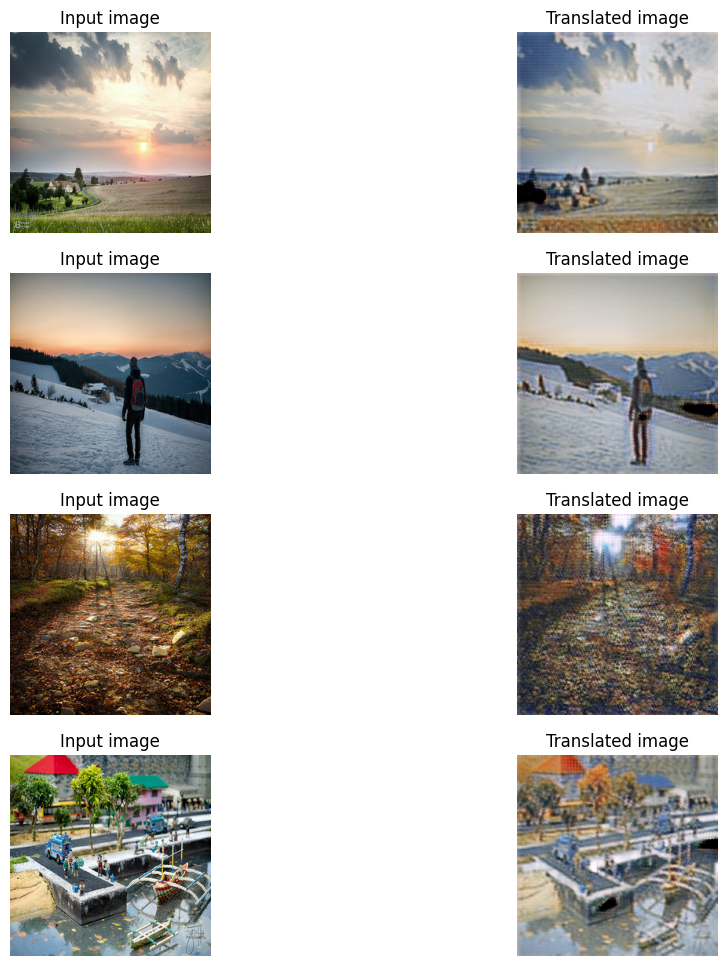

300/300 [==============================] - 41s 137ms/step - G_loss: 3.5603 - F_loss: 3.5117 - D_X_loss: 0.1911 - D_Y_loss: 0.1732
Epoch 15/20
300/300 [==============================] - ETA: 0s - G_loss: 3.4838 - F_loss: 3.4463 - D_X_loss: 0.1927 - D_Y_loss: 0.1774

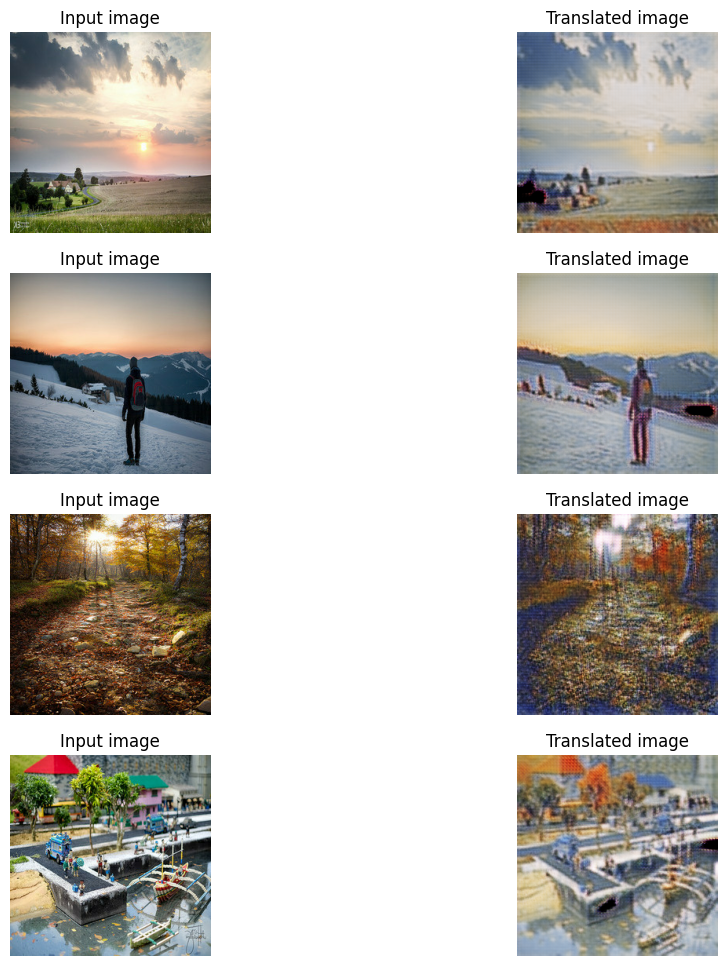

300/300 [==============================] - 41s 136ms/step - G_loss: 3.4807 - F_loss: 3.4503 - D_X_loss: 0.1929 - D_Y_loss: 0.1779
Epoch 16/20
300/300 [==============================] - ETA: 0s - G_loss: 3.4397 - F_loss: 3.4305 - D_X_loss: 0.1984 - D_Y_loss: 0.1803

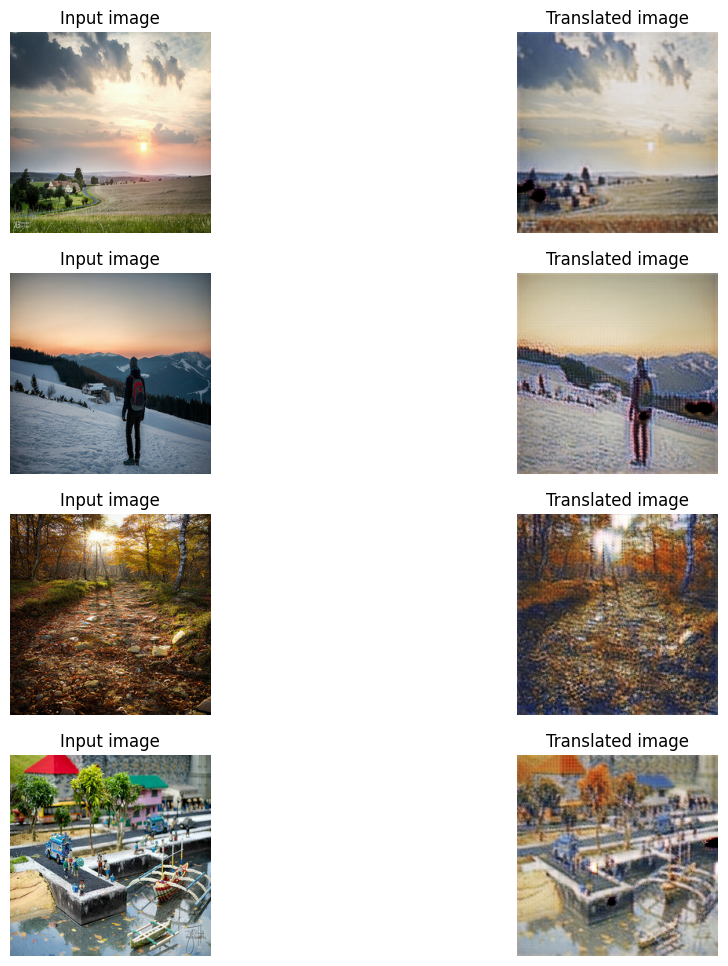

300/300 [==============================] - 41s 136ms/step - G_loss: 3.4369 - F_loss: 3.4337 - D_X_loss: 0.1988 - D_Y_loss: 0.1806
Epoch 17/20
300/300 [==============================] - ETA: 0s - G_loss: 3.4063 - F_loss: 3.3968 - D_X_loss: 0.1909 - D_Y_loss: 0.1752

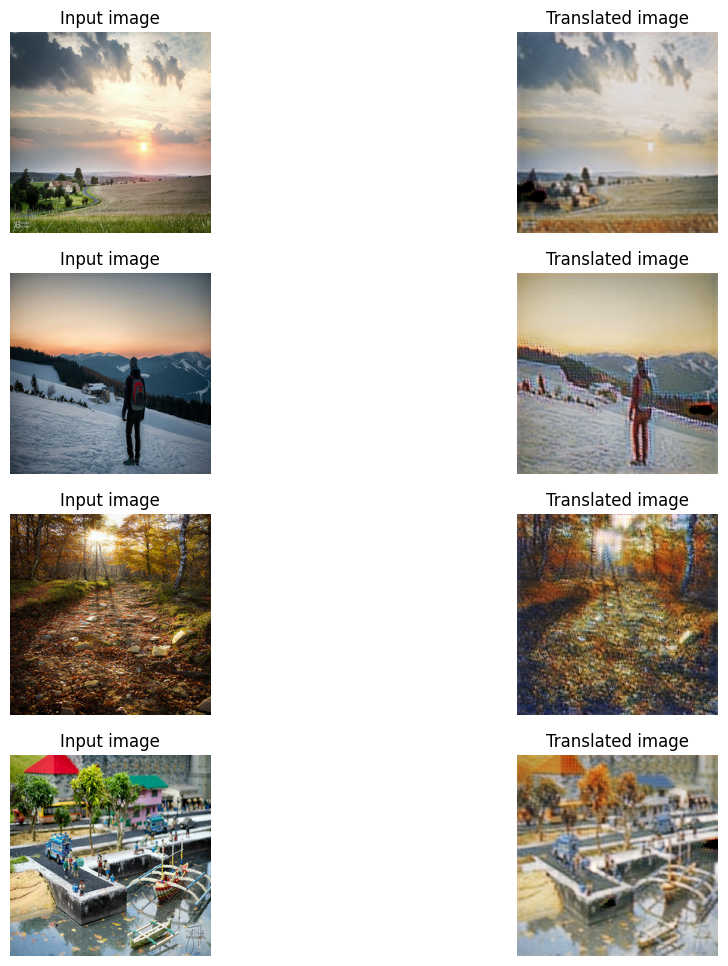

300/300 [==============================] - 41s 136ms/step - G_loss: 3.4024 - F_loss: 3.4017 - D_X_loss: 0.1911 - D_Y_loss: 0.1755
Epoch 18/20
300/300 [==============================] - ETA: 0s - G_loss: 3.3942 - F_loss: 3.4360 - D_X_loss: 0.1933 - D_Y_loss: 0.1766

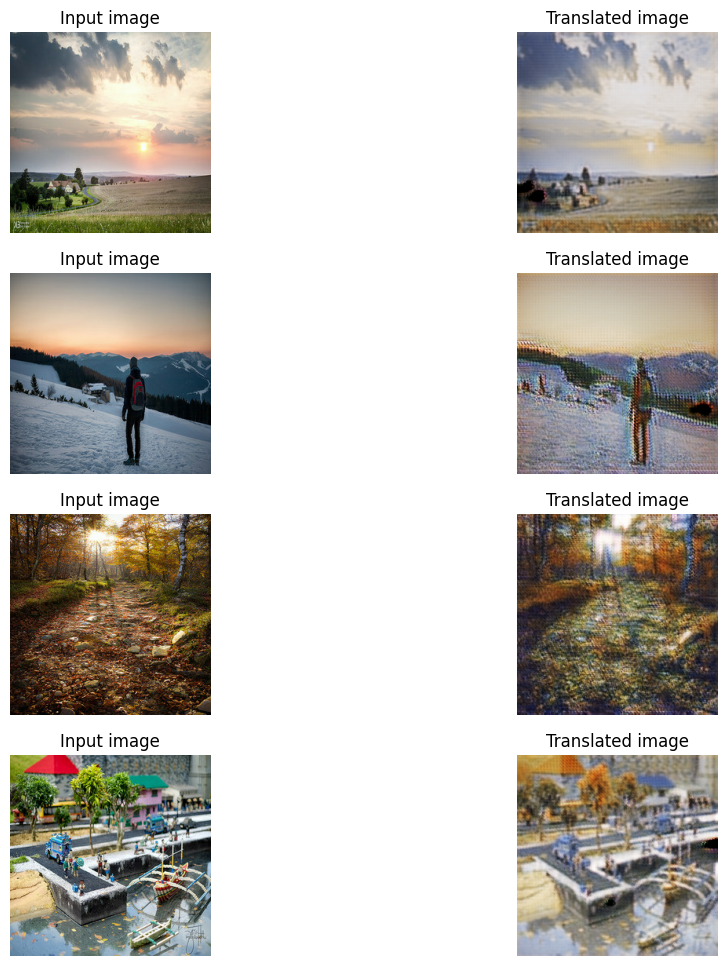

300/300 [==============================] - 41s 136ms/step - G_loss: 3.3908 - F_loss: 3.4374 - D_X_loss: 0.1936 - D_Y_loss: 0.1767
Epoch 19/20
300/300 [==============================] - ETA: 0s - G_loss: 3.3597 - F_loss: 3.4174 - D_X_loss: 0.1912 - D_Y_loss: 0.1792

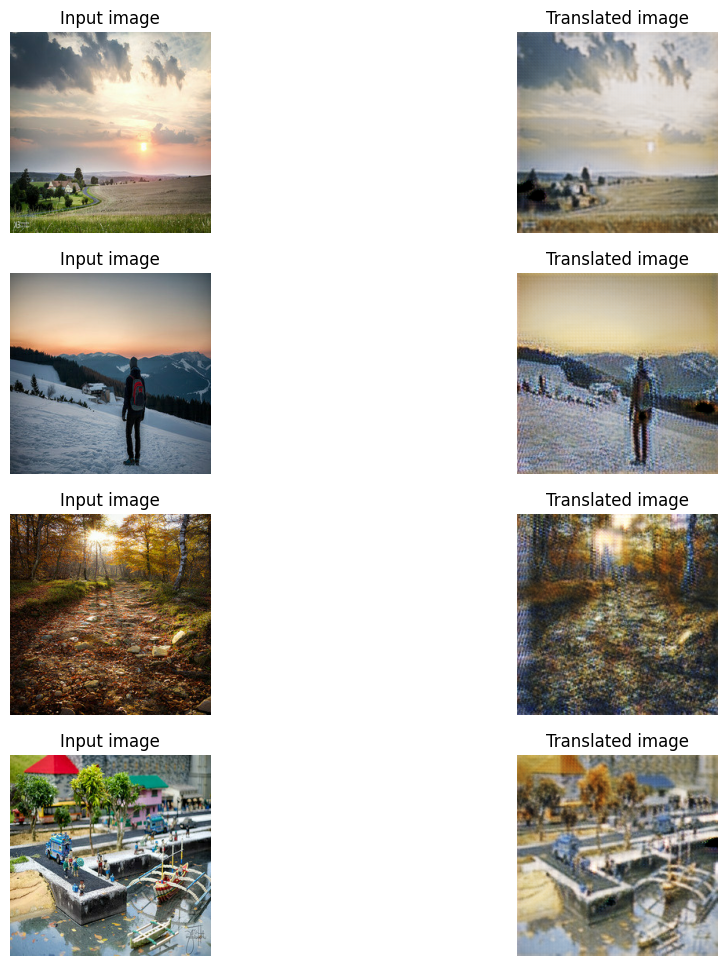

300/300 [==============================] - 42s 141ms/step - G_loss: 3.3572 - F_loss: 3.4199 - D_X_loss: 0.1916 - D_Y_loss: 0.1794
Epoch 20/20
300/300 [==============================] - ETA: 0s - G_loss: 3.3956 - F_loss: 3.4015 - D_X_loss: 0.1857 - D_Y_loss: 0.1713

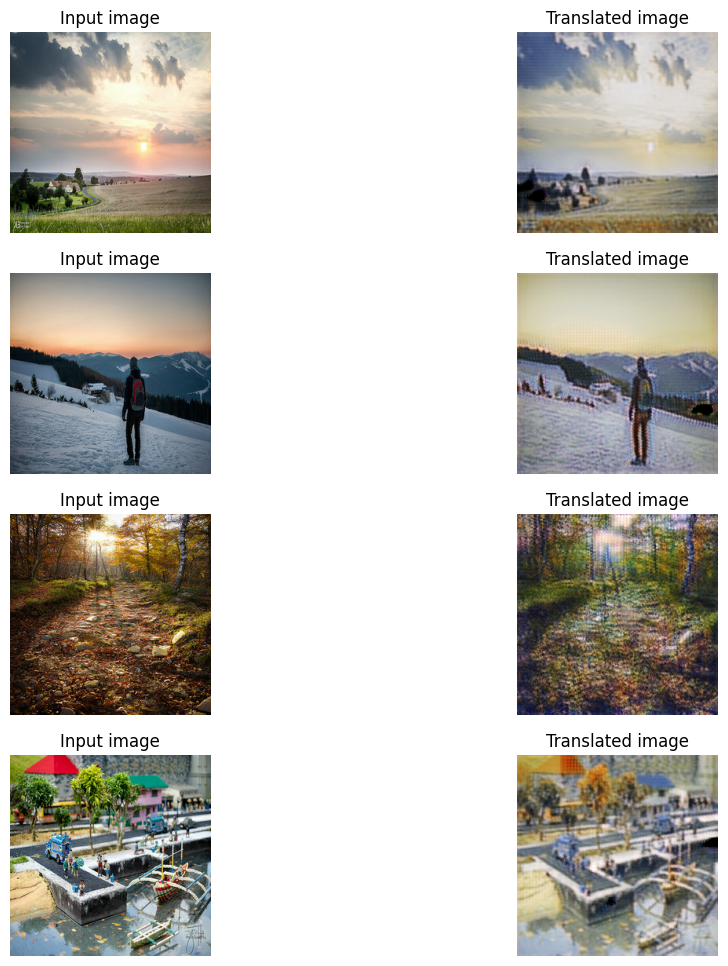

300/300 [==============================] - 41s 136ms/step - G_loss: 3.3930 - F_loss: 3.4031 - D_X_loss: 0.1859 - D_Y_loss: 0.1716


In [31]:
# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath, save_weights_only=True
)

# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.
cycle_gan_model.fit(
    tf.data.Dataset.zip((photo_ds, monet_ds)),
    epochs=20,
    callbacks=[plotter, model_checkpoint_callback],
)

In [32]:
import PIL
! mkdir ../images

In [33]:
for i, img in enumerate(photo_ds):
  prediction = cycle_gan_model.gen_G(img)[0].numpy()
  prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
  img = PIL.Image.fromarray(prediction)
  img.save("../images/" + str(i) + ".jpg")

In [34]:
import shutil
shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")

'/kaggle/working/images.zip'

Just looking at images, I think that this CycleGan did a really great job to learn Monet style. I think we can see even more improvement if we can run it longer (more epochs) and also it could be benefitial to try to use data augmentation.

# 6. Conclusion

It was really nice to learn how generator and generator can be used together to build DNN that learns "Monet" style and then apply this style to random photos.

I think we can see even better results with data augmentation and longer learning (more epochs), but would require access to more powefull computers.

# 7. References

1. https://keras.io/examples/generative/cyclegan/
2. https://arxiv.org/pdf/1703.10593.pdf
3. https://www.tensorflow.org/tutorials/generative/cyclegan
4. https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook